# Loading Image

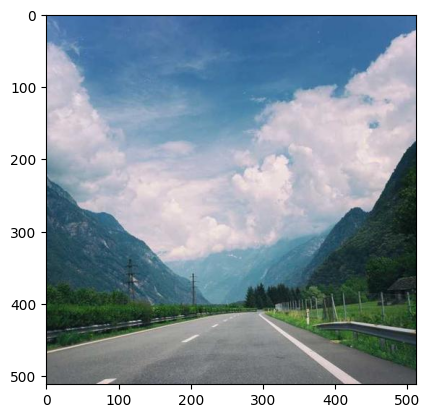

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import requests

url = "https://fastly.picsum.photos/id/519/512/512.jpg?hmac=gGK4DY5c6HaKYKngSjMaYtwuEw-rGXZYTn3bJKMjUKE"
# Loading the image 
image_nparray = np.asarray(bytearray(requests.get(url).content), dtype="uint8")
img = cv2.imdecode(image_nparray, cv2.IMREAD_COLOR)
plt.imshow(img[...,::-1])

In [3]:
# PCA compression function
def compressImage(img, pca_num):
    
    blue,green,red = cv2.split(img) 
    #initialize PCA with first 20 principal components
    pca = PCA(pca_num)
    
    #Applying to red channel and then applying inverse transform to transformed array.
    red_transformed = pca.fit_transform(red)
    red_inverted = pca.inverse_transform(red_transformed)
    
    #Applying to Green channel and then applying inverse transform to transformed array.
    green_transformed = pca.fit_transform(green)
    green_inverted = pca.inverse_transform(green_transformed)
    
    #Applying to Blue channel and then applying inverse transform to transformed array.
    blue_transformed = pca.fit_transform(blue)
    blue_inverted = pca.inverse_transform(blue_transformed)
    return (np.dstack((red_inverted, green_inverted, blue_inverted))).astype(np.uint8)
    

# Visualize Images

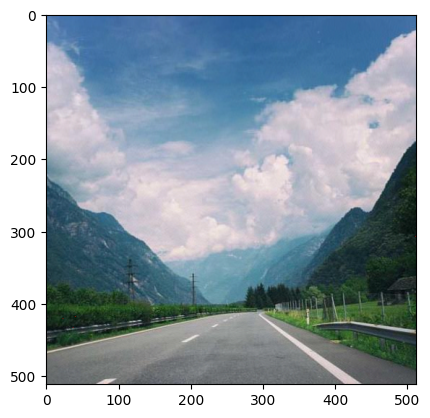

In [13]:
fig, ax = plt.subplots()
anime =[]
for pca_num in range(10, 150,5):
    compressed_img = compressImage(img,pca_num)
    im = ax.imshow(compressed_img,animated=True)
    anime.append([im])


In [14]:
import matplotlib.animation as animation
from IPython.display import HTML

ani = animation.ArtistAnimation(fig, anime, interval=300, blit=True,repeat_delay=50)
HTML(ani.to_jshtml())